# ***Title: Climate Data Clustering***

# Description

---


This project focuses on clustering and dimensionality reduction techniques applied to global weather data. The aim is to uncover hidden patterns, relationships, and groupings in weather-related features using machine learning algorithms like Mean Shift, Hierarchical Clustering, PCA, t-SNE, and Gaussian Mixture Models (GMM). Through visualization and analysis, it explores how weather variables interact and how distinct weather profiles can be identified.

# Goal
---
Primary Goal:

Perform unsupervised learning on weather data to group similar weather patterns and reduce the complexity of high-dimensional data for better interpretability.

---
Secondary Goals:

*   Identify clusters of weather conditions that occur together.
*   Visualize these clusters in two dimensions using PCA and t-SNE.
*   Compare clustering results across different algorithms.
*  Provide insights that can support forecasting, climate research, and decision-making for sectors affected by weather patterns.

# About the Dataset


---


The dataset contains global weather observations with various meteorological attributes. It includes features such as:


*   Humidity – Amount of moisture in the air.
*   Pressure (mb) – Atmospheric pressure.
*   Wind Speed (kph) – The velocity of wind.
*   Precipitation (mm) – Rain or snowfall amount.
*   Cloud Cover – Cloudiness percentage.
*   UV Index – Ultraviolet radiation levels.

This data covers different locations, times, and conditions, providing a comprehensive view of weather variability.

# Use Case


---


* Climate Analysis: Discover regions with similar weather profiles or extreme weather events.

* Agriculture: Assist in understanding how weather patterns affect crop growth and agricultural planning.

* Energy Planning: Support forecasting energy demand based on weather variability.

* Travel & Tourism: Identify weather trends that influence tourism activities and travel advisories.

* Environmental Research: Help scientists analyze correlations between climate variables and environmental changes.

# ***Phase 1: Data Source***

# Importing Libraries

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Set style for plots
plt.style.use('ggplot')
sns.set_palette("husl")

# Load the data
df = pd.read_csv("/content/GlobalWeatherRepository.csv")

print("Dataset shape:", df.shape)
print("\nFirst few rows:")
df.head()

Dataset shape: (4416, 41)

First few rows:


,country,location_name,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,condition_text,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
0,Afghanistan,Kabul,34.52,69.18,Asia/Kabul,1715849100,5/16/2024 13:15,26.6,79.8,Partly Cloudy,...,8.4,26.6,1.0,1.0,4:50 AM,6:50 PM,12:12 PM,1:11 AM,Waxing Gibbous,55.0
1,Albania,Tirana,41.33,19.82,Europe/Tirane,1715849100,5/16/2024 10:45,19.0,66.2,Partly cloudy,...,1.1,2.0,1.0,1.0,5:21 AM,7:54 PM,12:58 PM,2:14 AM,Waxing Gibbous,55.0
2,Algeria,Algiers,36.76,3.05,Africa/Algiers,1715849100,5/16/2024 9:45,23.0,73.4,Sunny,...,10.4,18.4,1.0,1.0,5:40 AM,7:50 PM,1:15 PM,2:14 AM,Waxing Gibbous,55.0
3,Andorra,Andorra La Vella,42.50,1.52,Europe/Andorra,1715849100,5/16/2024 10:45,6.3,43.3,Light drizzle,...,0.7,0.9,1.0,1.0,6:31 AM,9:11 PM,2:12 PM,3:31 AM,Waxing Gibbous,55.0
4,Angola,Luanda,-8.84,13.23,Africa/Luanda,1715849100,5/16/2024 9:45,26.0,78.8,Partly cloudy,...,183.4,262.3,5.0,10.0,6:12 AM,5:55 PM,1:17 PM,12:38 AM,Waxing Gibbous,55.0


# Data Exploration

In [ ]:
print("=== DATASET INFORMATION ===")
print(f"Shape: {df.shape}")
print(f"Columns: {df.columns.tolist()}")
print(f"\nData Types:\n{df.dtypes}")
print(f"\nMissing Values:\n{df.isnull().sum()}")
print(f"\nDuplicate Rows: {df.duplicated().sum()}")

# Check basic statistics
print("\n=== NUMERICAL COLUMNS STATISTICS ===")
print(df.describe())

print("\n=== CATEGORICAL COLUMNS STATISTICS ===")
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    print(f"\n{col}: {df[col].nunique()} unique values")
    if df[col].nunique() < 20:
        print(df[col].value_counts())

=== DATASET INFORMATION ===
Shape: (4416, 41)
Columns: ['country', 'location_name', 'latitude', 'longitude', 'timezone', 'last_updated_epoch', 'last_updated', 'temperature_celsius', 'temperature_fahrenheit', 'condition_text', 'wind_mph', 'wind_kph', 'wind_degree', 'wind_direction', 'pressure_mb', 'pressure_in', 'precip_mm', 'precip_in', 'humidity', 'cloud', 'feels_like_celsius', 'feels_like_fahrenheit', 'visibility_km', 'visibility_miles', 'uv_index', 'gust_mph', 'gust_kph', 'air_quality_Carbon_Monoxide', 'air_quality_Ozone', 'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_us-epa-index', 'air_quality_gb-defra-index', 'sunrise', 'sunset', 'moonrise', 'moonset', 'moon_phase', 'moon_illumination']

Data Types:
country                          object
location_name                    object
latitude                        float64
longitude                       float64
timezone                         object
last_updated_e

This output provides key information about the dataset's structure, data types, and missing values. You can see the total number of rows and columns, the data type of each column, and a count of how many missing values are present in each column. This helps in understanding the initial state of the data and identifying areas that may require cleaning or imputation before analysis.

# Data Preprocessing

In [ ]:
# Create a copy for preprocessing
df_clean = df.copy()

# Handle missing values
print("Missing values before handling:")
print(df_clean.isnull().sum())

# For numerical columns, fill with median
numerical_cols = df_clean.select_dtypes(include=[np.number]).columns
imputer_num = SimpleImputer(strategy='median')
df_clean[numerical_cols] = imputer_num.fit_transform(df_clean[numerical_cols])

# For categorical columns, fill with mode
categorical_cols = df_clean.select_dtypes(include=['object']).columns
imputer_cat = SimpleImputer(strategy='most_frequent')
df_clean[categorical_cols] = imputer_cat.fit_transform(df_clean[categorical_cols])

print("\nMissing values after handling:")
print(df_clean.isnull().sum())

# Convert time columns to datetime
df_clean['last_updated'] = pd.to_datetime(df_clean['last_updated'], format='%Y-%m-%d %H:%M', errors='coerce')
df_clean['sunrise'] = pd.to_datetime(df_clean['sunrise'], format='%I:%M %p', errors='coerce')
df_clean['sunset'] = pd.to_datetime(df_clean['sunset'], format='%I:%M %p', errors='coerce')
df_clean['moonrise'] = pd.to_datetime(df_clean['moonrise'], format='%I:%M %p', errors='coerce')
df_clean['moonset'] = pd.to_datetime(df_clean['moonset'], format='%I:%M %p', errors='coerce')

# Handle 'No moonset' values
df_clean['moonset'] = df_clean['moonset'].replace('No moonset', pd.NaT)

Missing values before handling:
country                         0
location_name                   0
latitude                        0
longitude                       0
timezone                        0
last_updated_epoch              0
last_updated                    0
temperature_celsius             0
temperature_fahrenheit          0
condition_text                  0
wind_mph                        0
wind_kph                        0
wind_degree                     0
wind_direction                  0
pressure_mb                     0
pressure_in                     0
precip_mm                       0
precip_in                       0
humidity                        0
cloud                           0
feels_like_celsius              0
feels_like_fahrenheit           1
visibility_km                   1
visibility_miles                1
uv_index                        1
gust_mph                        1
gust_kph                        1
air_quality_Carbon_Monoxide     1
air_quality_Ozon

# Feature Engineering

In [ ]:
# Extract time-based features
df_clean['hour_of_day'] = df_clean['last_updated'].dt.hour
df_clean['day_of_week'] = df_clean['last_updated'].dt.dayofweek
df_clean['month'] = df_clean['last_updated'].dt.month
df_clean['is_weekend'] = df_clean['day_of_week'].isin([5, 6]).astype(int)

# Extract time features from sunrise/sunset
df_clean['sunrise_hour'] = df_clean['sunrise'].dt.hour
df_clean['sunset_hour'] = df_clean['sunset'].dt.hour
df_clean['daylight_hours'] = (df_clean['sunset_hour'] - df_clean['sunrise_hour']).abs()

# Create temperature difference features
df_clean['temp_feels_diff_c'] = df_clean['temperature_celsius'] - df_clean['feels_like_celsius']
df_clean['temp_feels_diff_f'] = df_clean['temperature_fahrenheit'] - df_clean['feels_like_fahrenheit']

# Create wind speed categories
df_clean['wind_speed_category'] = pd.cut(df_clean['wind_kph'],
                                       bins=[0, 10, 20, 30, 40, np.inf],
                                       labels=['Calm', 'Light', 'Moderate', 'Strong', 'Storm'])

# Create temperature categories
df_clean['temp_category'] = pd.cut(df_clean['temperature_celsius'],
                                 bins=[-np.inf, 0, 10, 20, 30, 40, np.inf],
                                 labels=['Freezing', 'Cold', 'Cool', 'Warm', 'Hot', 'Very Hot'])

# Create humidity categories
df_clean['humidity_category'] = pd.cut(df_clean['humidity'],
                                     bins=[0, 30, 60, 80, 100],
                                     labels=['Dry', 'Comfortable', 'Humid', 'Very Humid'])

# Create pressure categories
df_clean['pressure_category'] = pd.cut(df_clean['pressure_mb'],
                                     bins=[0, 1000, 1013, 1020, np.inf],
                                     labels=['Low', 'Normal', 'High', 'Very High'])

print("New features created:")
new_features = [col for col in df_clean.columns if col not in df.columns]
print(new_features)

New features created:
['hour_of_day', 'day_of_week', 'month', 'is_weekend', 'sunrise_hour', 'sunset_hour', 'daylight_hours', 'temp_feels_diff_c', 'temp_feels_diff_f', 'wind_speed_category', 'temp_category', 'humidity_category', 'pressure_category']


This cell's output lists the new features that were created during the feature engineering step. These features are derived from existing columns and can potentially provide more useful information for the downstream analysis and modeling tasks.

# Feature Selection

In [ ]:
# Select features for standardization (numerical features that are not IDs or dates)
features_to_scale = [
    'latitude', 'longitude', 'last_updated_epoch', 'temperature_celsius',
    'temperature_fahrenheit', 'wind_mph', 'wind_kph', 'wind_degree',
    'pressure_mb', 'pressure_in', 'precip_mm', 'precip_in', 'humidity',
    'cloud', 'feels_like_celsius', 'feels_like_fahrenheit', 'visibility_km',
    'visibility_miles', 'uv_index', 'gust_mph', 'gust_kph',
    'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
    'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
    'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_us-epa-index',
    'air_quality_gb-defra-index', 'moon_illumination', 'hour_of_day',
    'day_of_week', 'month', 'sunrise_hour', 'sunset_hour', 'daylight_hours',
    'temp_feels_diff_c', 'temp_feels_diff_f'
]

# Filter to only include columns that exist in the dataframe
features_to_scale = [col for col in features_to_scale if col in df_clean.columns]

print(f"Selected {len(features_to_scale)} features for scaling")

Selected 38 features for scaling


This cell's output indicates the number of features selected for scaling. These features are numerical and will be used in subsequent steps for standardization and clustering.

# Standardization

In [ ]:
# Initialize the scaler
scaler = StandardScaler()

# Create a copy for standardized data
df_standardized = df_clean.copy()

# Standardize the selected features
df_standardized[features_to_scale] = scaler.fit_transform(df_clean[features_to_scale])

print("Standardization completed!")
print(f"Standardized features mean: {df_standardized[features_to_scale].mean().mean():.4f}")
print(f"Standardized features std: {df_standardized[features_to_scale].std().mean():.4f}")

Standardization completed!
Standardized features mean: 0.0000
Standardized features std: 1.0001


# Visualization

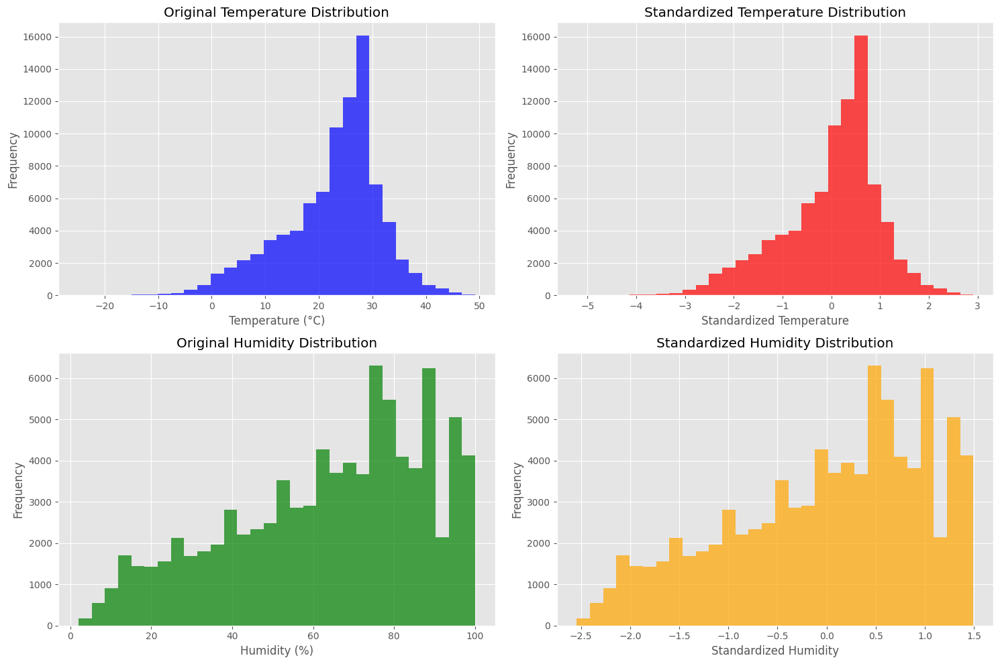

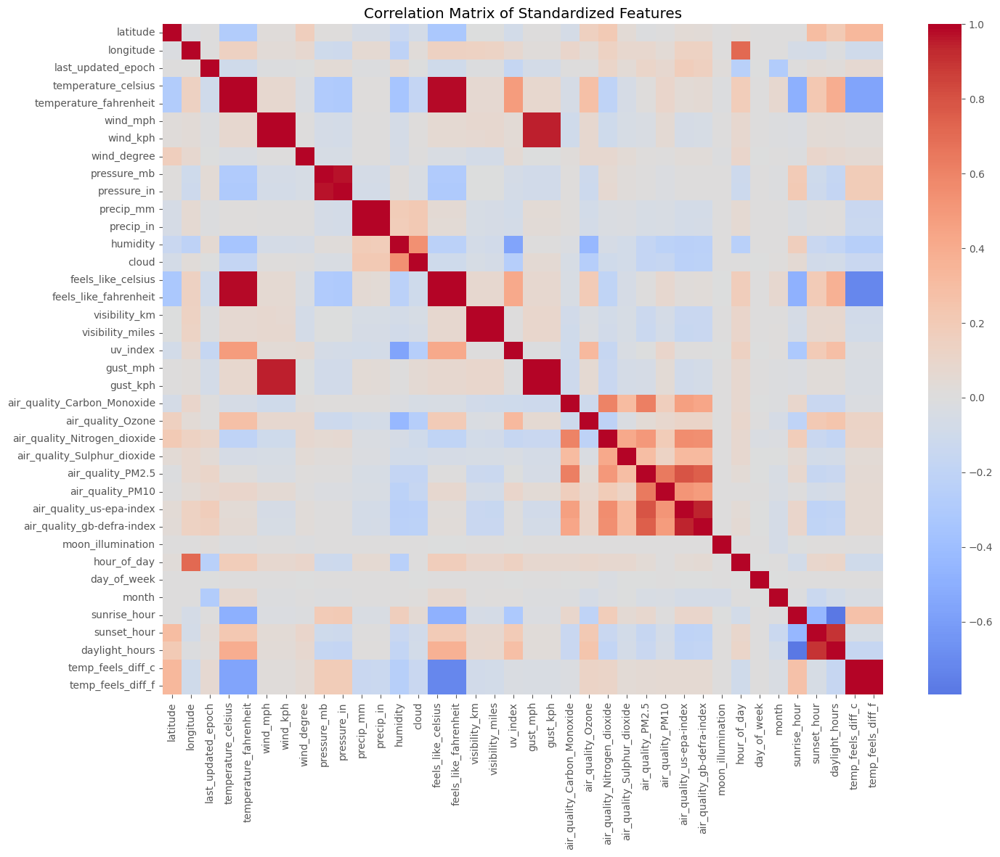

In [ ]:
# Plot distribution of original vs standardized features
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Original temperature distribution
axes[0, 0].hist(df_clean['temperature_celsius'], bins=30, alpha=0.7, color='blue')
axes[0, 0].set_title('Original Temperature Distribution')
axes[0, 0].set_xlabel('Temperature (°C)')
axes[0, 0].set_ylabel('Frequency')

# Standardized temperature distribution
axes[0, 1].hist(df_standardized['temperature_celsius'], bins=30, alpha=0.7, color='red')
axes[0, 1].set_title('Standardized Temperature Distribution')
axes[0, 1].set_xlabel('Standardized Temperature')
axes[0, 1].set_ylabel('Frequency')

# Original humidity distribution
axes[1, 0].hist(df_clean['humidity'], bins=30, alpha=0.7, color='green')
axes[1, 0].set_title('Original Humidity Distribution')
axes[1, 0].set_xlabel('Humidity (%)')
axes[1, 0].set_ylabel('Frequency')

# Standardized humidity distribution
axes[1, 1].hist(df_standardized['humidity'], bins=30, alpha=0.7, color='orange')
axes[1, 1].set_title('Standardized Humidity Distribution')
axes[1, 1].set_xlabel('Standardized Humidity')
axes[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

# Correlation heatmap of standardized features
plt.figure(figsize=(16, 12))
correlation_matrix = df_standardized[features_to_scale].corr()
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', center=0)
plt.title('Correlation Matrix of Standardized Features')
plt.show()

The output of this cell shows two types of visualizations:

 * histograms and a correlation heatmap. The histograms on the top show the distribution of the 'temperature_celsius' and 'humidity' features before and after standardization. You can see how standardization centers the data around zero and scales it to unit variance.


---



 * The heatmap at the bottom shows the correlation matrix of the standardized features. This helps to visualize the relationships between different features, with warmer colors indicating positive correlation and cooler colors indicating negative correlation. Features with high absolute correlation might be redundant and could be considered for removal during feature selection.

# ***Phase 2: Normal EDA Graphs***

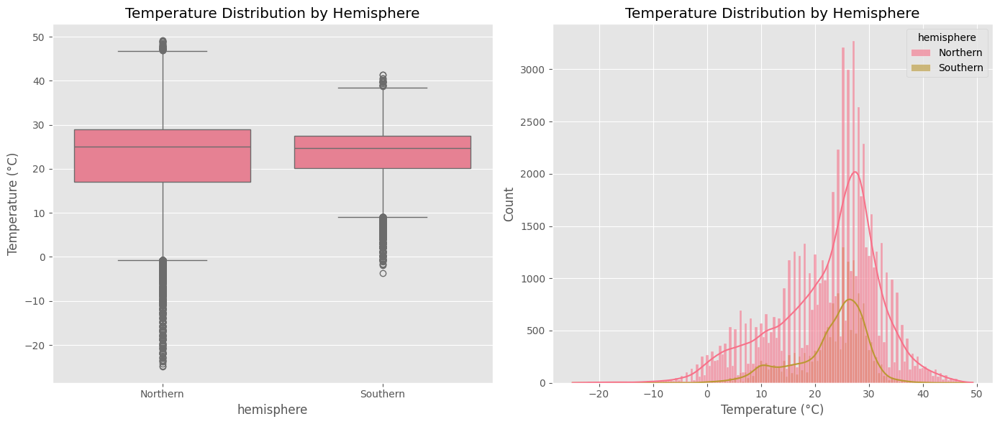

In [ ]:
# Create hemisphere column
df['hemisphere'] = np.where(df['latitude'] >= 0, 'Northern', 'Southern')

# Plot temperature distribution by hemisphere
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.boxplot(x='hemisphere', y='temperature_celsius', data=df)
plt.title('Temperature Distribution by Hemisphere')
plt.ylabel('Temperature (°C)')

plt.subplot(1, 2, 2)
sns.histplot(data=df, x='temperature_celsius', hue='hemisphere', kde=True, alpha=0.6)
plt.title('Temperature Distribution by Hemisphere')
plt.xlabel('Temperature (°C)')
plt.tight_layout()
plt.show()

The plots show how temperatures are spread out in the Northern and Southern parts of the world based on latitude. The box plot on the left gives you a quick summary: the box shows where the middle half of the temperatures fall, the line in the box is the average (median), and the "whiskers" show the range of most of the data. The dots outside are extreme temperatures. You can see if one hemisphere generally has higher or lower temperatures, or a wider range. The plot on the right, the histogram, shows how often different temperatures occur in each hemisphere. The curves show the overall shape of the temperature spread for each. Together, these plots help us see if there's a noticeable difference in temperature patterns between the Northern and Southern Hemispheres in this dataset.

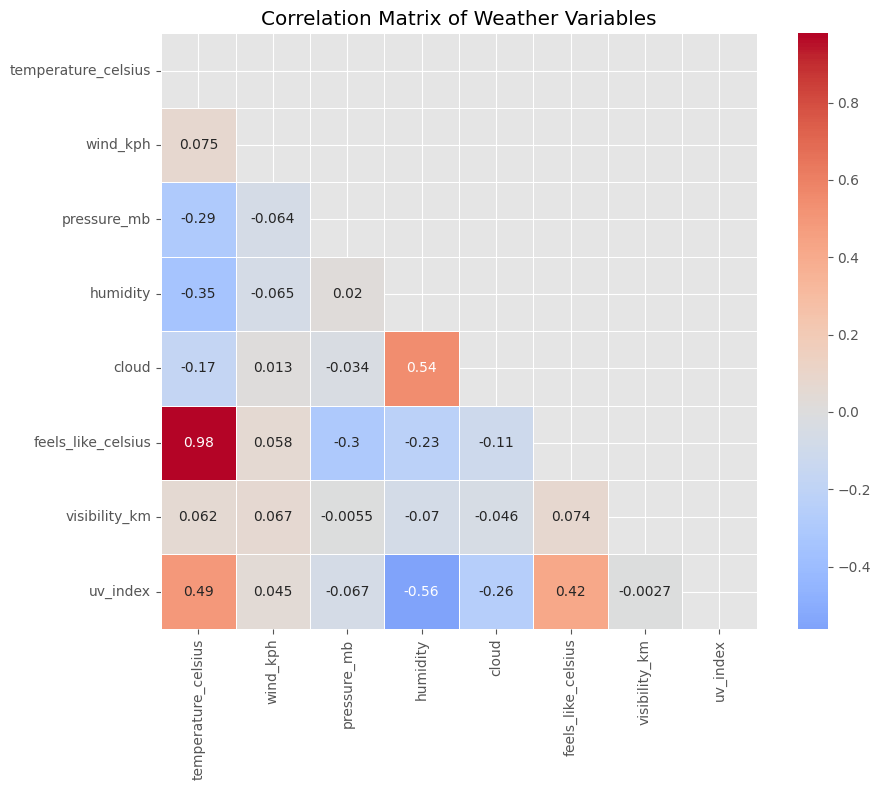

In [ ]:
# Select numerical columns for correlation
numerical_cols = ['temperature_celsius', 'wind_kph', 'pressure_mb', 'humidity',
                  'cloud', 'feels_like_celsius', 'visibility_km', 'uv_index']

# Calculate correlation matrix
corr_matrix = df[numerical_cols].corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', center=0,
            square=True, linewidths=0.5)
plt.title('Correlation Matrix of Weather Variables')
plt.tight_layout()
plt.show()

The heatmap shows the correlation between different weather variables.

* **Positive Correlation:** Variables with a positive correlation tend to increase or decrease together. For example, if temperature and humidity have a high positive correlation, as temperature rises, humidity also tends to rise.
* **Negative Correlation:** Variables with a negative correlation tend to move in opposite directions. For example, if temperature and pressure have a high negative correlation, as temperature rises, pressure tends to fall.
* **Near Zero Correlation:** Variables with a correlation close to zero have little to no linear relationship.

The numbers within each square represent the correlation coefficient, ranging from -1 (perfect negative correlation) to +1 (perfect positive correlation). A value of 0 indicates no linear correlation.

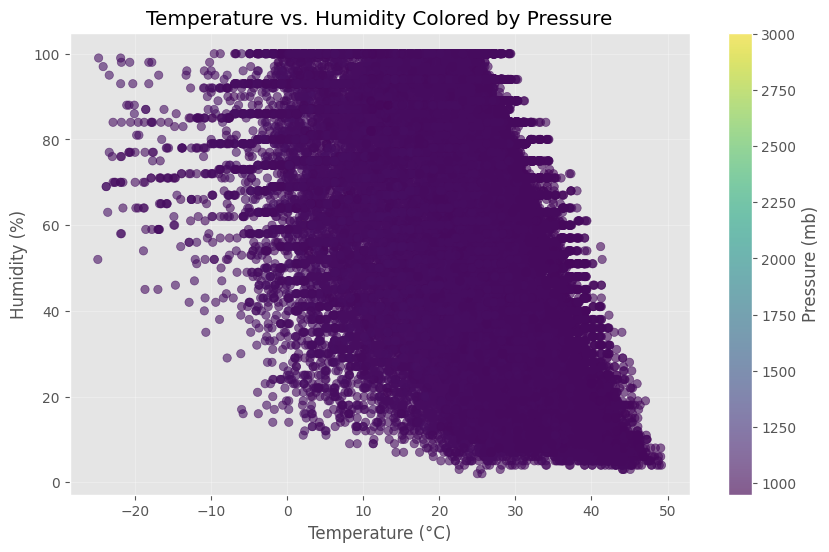

In [ ]:
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df['temperature_celsius'], df['humidity'],
                      c=df['pressure_mb'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Pressure (mb)')
plt.xlabel('Temperature (°C)')
plt.ylabel('Humidity (%)')
plt.title('Temperature vs. Humidity Colored by Pressure')
plt.grid(True, alpha=0.3)
plt.show()

This scatter plot shows the relationship between Temperature and Humidity, with the color of each data point indicating the Pressure level.

* **Temperature (°C) on the x-axis** and **Humidity (%) on the y-axis** allow us to see if there's a pattern between how hot or cold it is and how much moisture is in the air.
* **The color of each point** represents the **Pressure (mb)** at that location and time. The color bar on the right shows the range of pressure values corresponding to the colors.

By examining this plot, you can look for trends such as:
* Do higher temperatures tend to have lower or higher humidity?
* How does pressure relate to temperature and humidity? Are certain pressure ranges associated with specific combinations of temperature and humidity?
* Are there any clusters of points with similar colors (pressure) that might suggest distinct weather patterns?

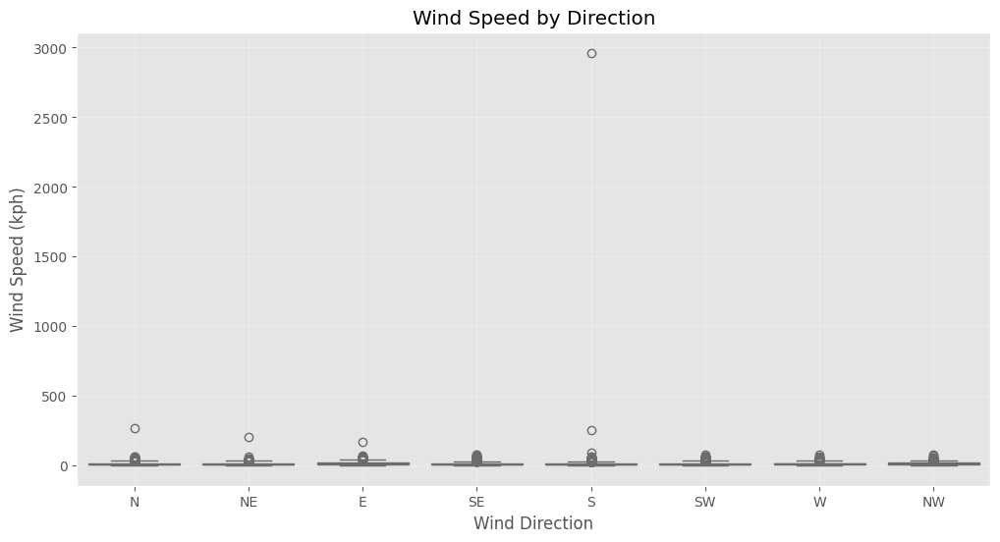

In [ ]:
# Create wind direction categories
def categorize_wind_direction(degree):
    if degree >= 337.5 or degree < 22.5:
        return 'N'
    elif 22.5 <= degree < 67.5:
        return 'NE'
    elif 67.5 <= degree < 112.5:
        return 'E'
    elif 112.5 <= degree < 157.5:
        return 'SE'
    elif 157.5 <= degree < 202.5:
        return 'S'
    elif 202.5 <= degree < 247.5:
        return 'SW'
    elif 247.5 <= degree < 292.5:
        return 'W'
    else:
        return 'NW'

df['wind_dir_category'] = df['wind_degree'].apply(categorize_wind_direction)

# Plot wind speed by direction
plt.figure(figsize=(12, 6))
sns.boxplot(x='wind_dir_category', y='wind_kph', data=df,
            order=['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW'])
plt.title('Wind Speed by Direction')
plt.xlabel('Wind Direction')
plt.ylabel('Wind Speed (kph)')
plt.grid(True, alpha=0.3)
plt.show()

This box plot shows the distribution of wind speed for each wind direction category. The box represents the interquartile range (IQR), with the median indicated by the line inside. The whiskers extend to 1.5 times the IQR from the box, and points beyond the whiskers are considered outliers. This visualization helps to understand the typical wind speeds and variability associated with different wind directions.

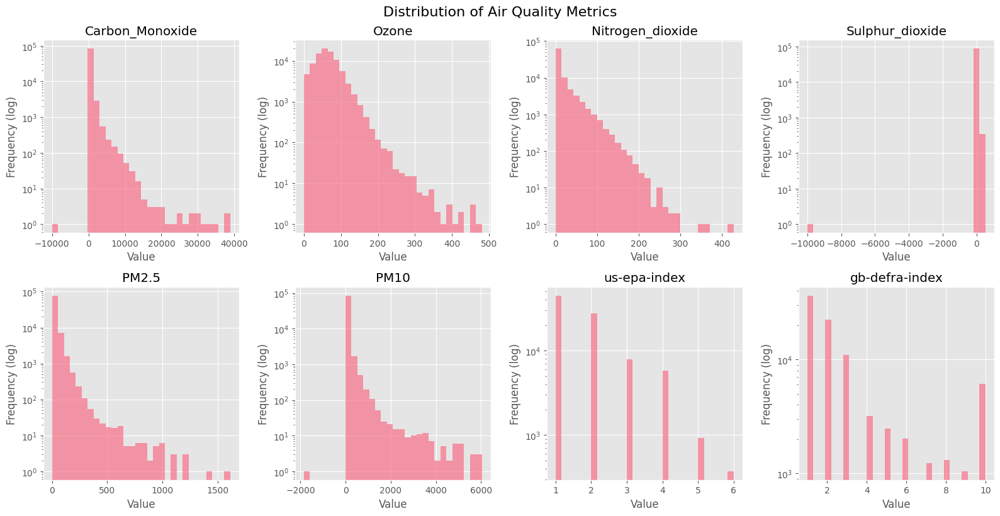

In [ ]:
# Create a subset of air quality columns
air_quality_cols = [col for col in df.columns if 'air_quality' in col]

# Plot distribution of air quality indices
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

for i, col in enumerate(air_quality_cols):
    if i < len(axes):
        # Log scale for better visualization of skewed data
        axes[i].hist(df[col].dropna(), bins=30, alpha=0.7, log=True)
        axes[i].set_title(col.replace('air_quality_', ''))
        axes[i].set_xlabel('Value')
        axes[i].set_ylabel('Frequency (log)')

plt.tight_layout()
plt.suptitle('Distribution of Air Quality Metrics', y=1.02, fontsize=16)
plt.show()

The output of this cell displays histograms showing the distribution of various air quality metrics, such as Carbon Monoxide, Ozone, Nitrogen Dioxide, Sulphur Dioxide, PM2.5, PM10, and air quality indices. The x-axis of each histogram represents the range of values for a specific air quality metric, while the y-axis indicates the frequency or count of data points falling within each value range. The use of a logarithmic scale on the y-axis helps to visualize the distribution more effectively, especially for metrics with a wide range of values or skewed distributions. These plots help in understanding the typical concentrations of different pollutants and the overall air quality levels present in the dataset.

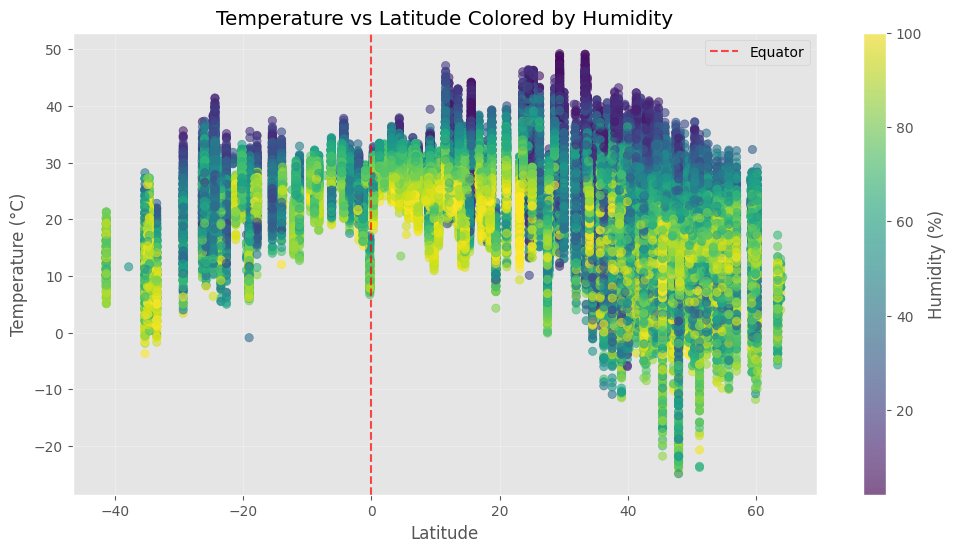

In [ ]:
plt.figure(figsize=(12, 6))
scatter = plt.scatter(df['latitude'], df['temperature_celsius'],
                      c=df['humidity'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Humidity (%)')
plt.xlabel('Latitude')
plt.ylabel('Temperature (°C)')
plt.title('Temperature vs Latitude Colored by Humidity')
plt.grid(True, alpha=0.3)
plt.axvline(0, color='red', linestyle='--', alpha=0.7, label='Equator')
plt.legend()
plt.show()

This scatter plot visualizes the relationship between Temperature and Latitude, with each data point colored according to its Humidity level.

* **Latitude on the x-axis** allows us to see how temperature changes as we move from the poles (high absolute latitude) towards the equator (latitude 0).
* **Temperature (°C) on the y-axis** shows the measured temperature at each location.
* **The color of each point** represents the **Humidity (%)**, with the color bar on the right indicating the range of humidity values.

The red dashed line marks the **Equator (Latitude 0)**, which is often associated with warmer temperatures.

By examining this plot, you can observe:
* The general trend of temperature decreasing as latitude increases (moving away from the equator).
* How humidity levels are distributed across different latitudes and temperatures.
* Whether there are any noticeable patterns or clusters related to temperature, latitude, and humidity combined.

# ***Phase 3: Interactive EDA Graphs***

# Importing necessary libraries

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# world map with temperature data

In [ ]:
fig = px.scatter_geo(df,
                     lat='latitude',
                     lon='longitude',
                     color='temperature_celsius',
                     hover_name='location_name',
                     hover_data=['country', 'temperature_celsius', 'humidity', 'condition_text'],
                     projection='natural earth',
                     title='World Temperature Distribution',
                     color_continuous_scale='thermal',
                     opacity=0.7)

fig.update_layout(height=600)
fig.show()

This interactive world map visualizes the distribution of temperature across different locations using a scatter geo plot.

*   Each point on the map represents a location from the dataset.
*   The color of each point indicates the temperature in Celsius, using a 'thermal' color scale where warmer colors represent higher temperatures.
*   Hovering over a point provides additional information about the location, including the country, temperature, humidity, and weather condition.
*   The 'natural earth' projection is used for the map.

This visualization allows you to explore the global temperature patterns and see how temperature varies geographically.

# Interactive correlation matrix heatmap

In [ ]:
# Select numerical columns for correlation
numerical_cols = ['temperature_celsius', 'wind_kph', 'pressure_mb', 'humidity',
                  'cloud', 'feels_like_celsius', 'visibility_km', 'uv_index']

# Calculate correlation matrix
corr_matrix = df[numerical_cols].corr()

# Create interactive heatmap
fig = ff.create_annotated_heatmap(
    z=corr_matrix.values,
    x=list(corr_matrix.columns),
    y=list(corr_matrix.index),
    annotation_text=corr_matrix.round(2).values,
    colorscale='RdBu_r',
    showscale=True
)

fig.update_layout(
    title='Interactive Correlation Matrix of Weather Variables',
    height=600,
    width=800
)

fig.show()

This interactive heatmap visualizes the correlation matrix of selected weather variables.

*   Each square in the heatmap represents the correlation coefficient between two weather variables.
*   The color intensity and shade indicate the strength and direction of the correlation (positive or negative). A color scale is provided to interpret the values.
*   Hovering your cursor over any square will display the exact correlation coefficient value.

This interactive visualization allows you to quickly explore the relationships between different weather variables and identify strong positive or negative correlations.

# 3D scatter plot

In [ ]:
def get_climate_zone(latitude):
    if latitude >= 60:
        return 'Polar'
    elif latitude >= 30:
        return 'Temperate'
    elif latitude >= 0:
        return 'Tropical'
    elif latitude >= -30:
        return 'Tropical'
    elif latitude >= -60:
        return 'Temperate'
    else:
        return 'Polar'

df['climate_zone'] = df['latitude'].apply(get_climate_zone)

In [ ]:
fig = px.scatter_3d(df,
                    x='temperature_celsius',
                    y='humidity',
                    z='pressure_mb',
                    color='climate_zone',
                    hover_name='location_name',
                    hover_data=['country', 'wind_kph', 'condition_text'],
                    title='3D View: Temperature, Humidity, and Pressure by Climate Zone',
                    opacity=0.7)

fig.update_layout(height=700)
fig.show()

This 3D scatter plot visualizes the relationship between temperature, humidity, and pressure, with each point colored according to its assigned climate zone (Polar, Temperate, or Tropical).

*   The x-axis represents **Temperature (°C)**, the y-axis represents **Humidity (%)**, and the z-axis represents **Pressure (mb)**.
*   The color of each point indicates the **Climate Zone** it belongs to.
*   Hovering over a point reveals additional information like location name, country, wind speed, and weather condition.

This plot helps in exploring potential relationships and patterns among these three weather variables across different climate zones. You can rotate and zoom the plot to view it from different angles.

# parallel coordinates plot

In [ ]:
fig = px.parallel_coordinates(df,
                              dimensions=['temperature_celsius', 'humidity', 'pressure_mb', 'wind_kph', 'uv_index'],
                              color='temperature_celsius',
                              color_continuous_scale='viridis',
                              labels={'temperature_celsius': 'Temperature (°C)',
                                      'humidity': 'Humidity (%)',
                                      'pressure_mb': 'Pressure (mb)',
                                      'wind_kph': 'Wind Speed (kph)',
                                      'uv_index': 'UV Index'},
                              title='Parallel Coordinates Plot of Weather Variables')

fig.update_layout(height=500)
fig.show()

This parallel coordinates plot visualizes multiple weather variables simultaneously.

*   Each vertical axis represents a different weather variable (Temperature, Humidity, Pressure, Wind Speed, UV Index).
*   Each line across the plot represents a single data point (a location's weather observation).
*   The position of the line on each axis corresponds to the value of that variable for that data point.
*   The lines are colored based on the Temperature, with the color scale on the right.

This plot is useful for identifying trends, clusters, and anomalies across several variables at once. You can see how individual data points behave across all selected dimensions and how values on one axis relate to values on others.

# sunburst chart showing climate zones by hemisphere and country

In [ ]:
fig = px.sunburst(df,
                  path=['hemisphere', 'country', 'climate_zone'],
                  values='temperature_celsius',
                  color='temperature_celsius',
                  color_continuous_scale='thermal',
                  title='Climate Zones Distribution by Hemisphere and Country')

fig.update_layout(height=700)
fig.show()

This sunburst chart visualizes the hierarchical distribution of climate zones within different hemispheres and countries, based on the average temperature.

*   The chart starts with the **Hemispheres** (Northern and Southern) at the center.
*   The next ring represents the **Countries** within each hemisphere.
*   The outermost ring shows the **Climate Zones** (Polar, Temperate, Tropical) within each country.
*   The size of each segment is determined by the sum of temperatures for that category.
*   The color of each segment indicates the average temperature, using a 'thermal' color scale.

This interactive plot allows you to explore the temperature distribution across different geographical and climatic categories. You can click on a segment to zoom in and see the distribution of its subcategories.

# ***Phase 4: Supervised Learning***

# Linear Regression

Mean Squared Error (MSE): 55.33
R² Score: 0.34


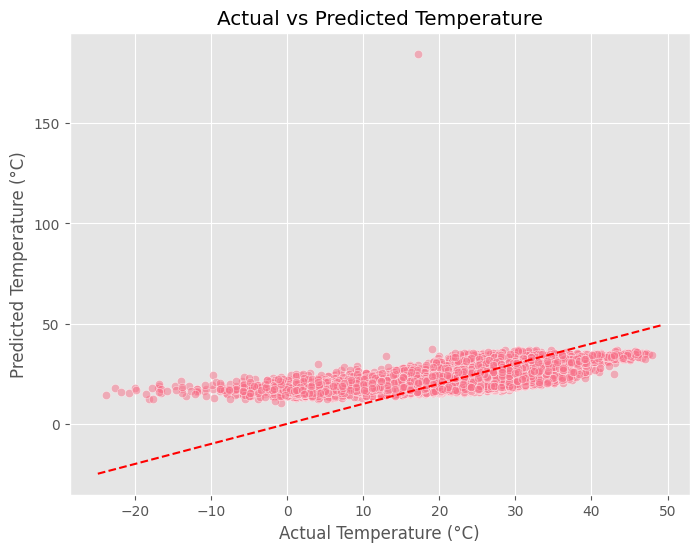

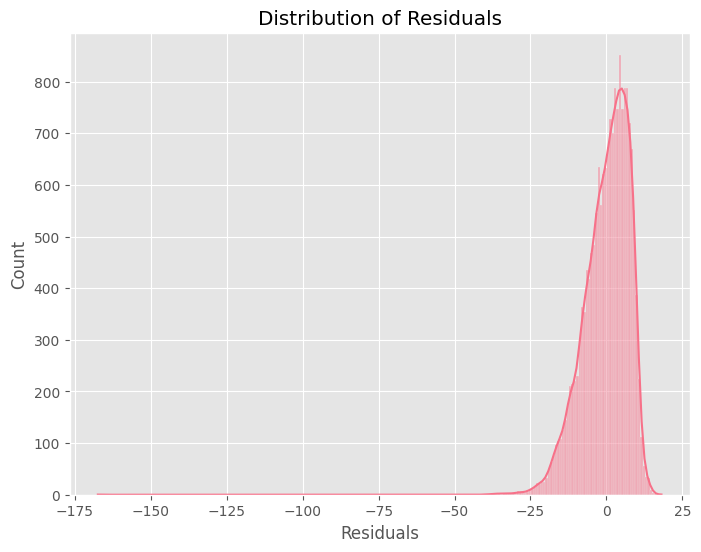

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Select numeric features and target
features = ['humidity', 'pressure_mb', 'wind_kph', 'precip_mm', 'cloud', 'uv_index']
target = 'temperature_celsius'

# Prepare X and y using the cleaned dataframe
X = df_clean[features]
y = df_clean[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R² Score: {r2:.2f}")

# Visualization: Actual vs Predicted
plt.figure(figsize=(8,6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Predicted Temperature (°C)")
plt.title("Actual vs Predicted Temperature")
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linestyle='--')
plt.show()

# Optional: Plotting residuals
residuals = y_test - y_pred
plt.figure(figsize=(8,6))
sns.histplot(residuals, kde=True)
plt.xlabel("Residuals")
plt.title("Distribution of Residuals")
plt.show()

This cell runs a Linear Regression model to predict `temperature_celsius` based on selected features (`humidity`, `pressure_mb`, `wind_kph`, `precip_mm`, `cloud`, `uv_index`).

*   **Mean Squared Error (MSE):** Measures the average squared difference between the actual temperature values and the predicted temperature values. A lower MSE indicates better model performance.
*   **R² Score:** Represents the proportion of the variance in the target variable (`temperature_celsius`) that is predictable from the independent variables (features). An R² score of 1 means the model perfectly predicts the target, while a score of 0 means the model performs no better than simply predicting the mean of the target variable.
*   **Actual vs Predicted Plot:** This scatter plot visualizes how the predicted temperatures compare to the actual temperatures. Points close to the red dashed line indicate good predictions.
*   **Distribution of Residuals Plot:** This histogram shows the distribution of the differences between the actual and predicted temperatures (residuals). Ideally, residuals should be normally distributed around zero.

Based on the MSE and R² score, you can assess how well the Linear Regression model performed on this task.

# Decision Tree

Mean Squared Error (MSE): 41.31
R² Score: 0.49


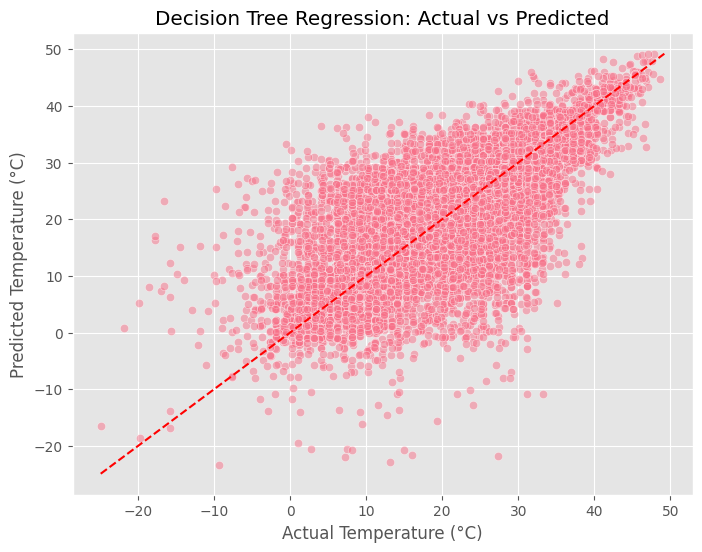

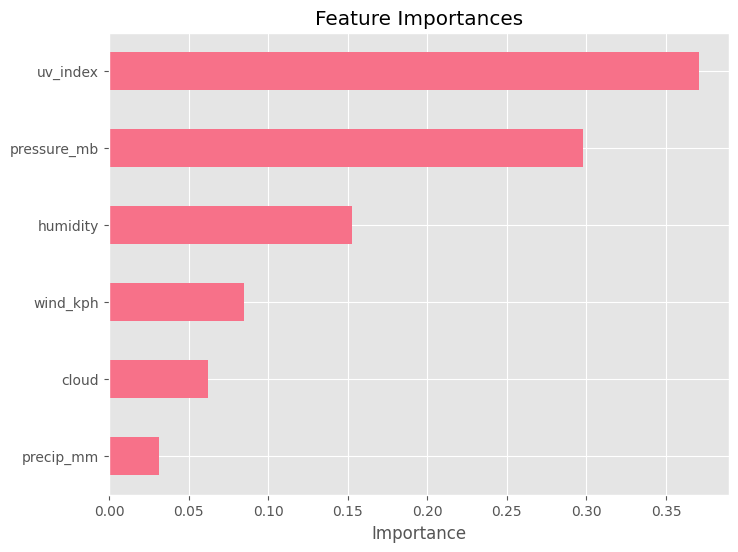

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/GlobalWeatherRepository.csv'  # Update if necessary
df = pd.read_csv(file_path)

# Select numeric features and target
features = ['humidity', 'pressure_mb', 'wind_kph', 'precip_mm', 'cloud', 'uv_index']
target = 'temperature_celsius'

# Prepare X and y
X = df[features]
y = df[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the Decision Tree regressor
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)

# Make predictions
y_pred = dt_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R² Score: {r2:.2f}")

# Visualization: Actual vs Predicted
plt.figure(figsize=(8,6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Predicted Temperature (°C)")
plt.title("Decision Tree Regression: Actual vs Predicted")
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linestyle='--')
plt.show()

# Visualization: Feature Importances
importances = dt_model.feature_importances_
feat_importances = pd.Series(importances, index=features)
plt.figure(figsize=(8,6))
feat_importances.sort_values().plot(kind='barh')
plt.title("Feature Importances")
plt.xlabel("Importance")
plt.show()


This cell runs a Decision Tree Regressor model to predict `temperature_celsius` using the selected features.

*   **Mean Squared Error (MSE):** This metric quantifies the average squared difference between the actual and predicted temperature values. A lower MSE indicates better accuracy of the model.
*   **R² Score:** This score represents the proportion of the variance in the actual temperature that can be explained by the model. An R² close to 1 suggests that the model fits the data well.
*   **Actual vs Predicted Plot:** This scatter plot shows how the predicted temperature values compare to the actual temperature values. Ideally, the points should lie close to the red dashed line, indicating accurate predictions.
*   **Feature Importances Plot:** This bar chart shows the relative importance of each input feature in the Decision Tree model's prediction process. Features with higher importance scores have a greater impact on the predicted temperature.

# Random Forest

Mean Squared Error (MSE): 21.60
R² Score: 0.73


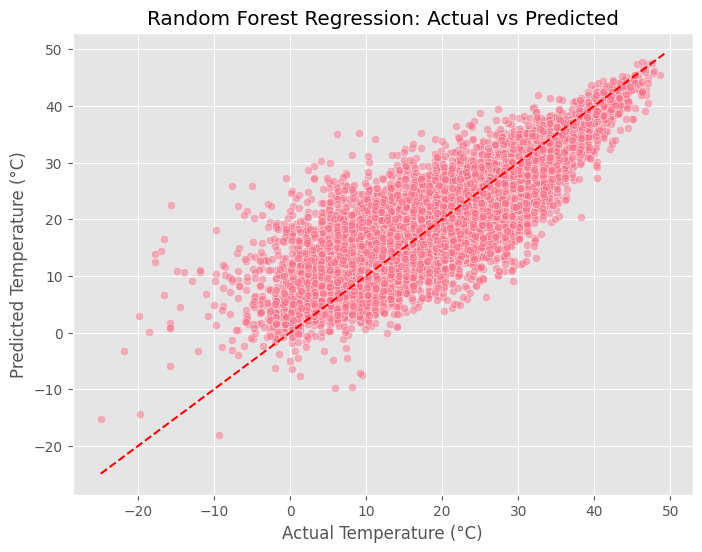

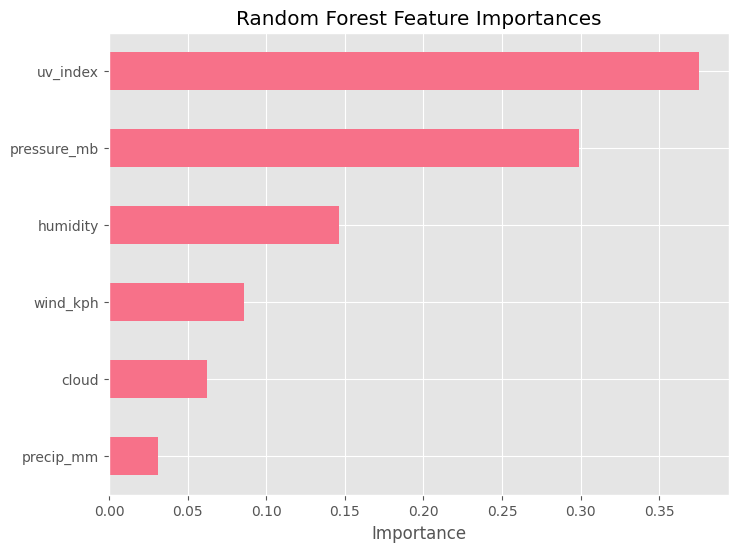

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/GlobalWeatherRepository.csv'  # Update if necessary
df = pd.read_csv(file_path)

# Select numeric features and target
features = ['humidity', 'pressure_mb', 'wind_kph', 'precip_mm', 'cloud', 'uv_index']
target = 'temperature_celsius'

# Prepare X and y
X = df[features]
y = df[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the Random Forest regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R² Score: {r2:.2f}")

# Visualization: Actual vs Predicted
plt.figure(figsize=(8,6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Predicted Temperature (°C)")
plt.title("Random Forest Regression: Actual vs Predicted")
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linestyle='--')
plt.show()

# Visualization: Feature Importances
importances = rf_model.feature_importances_
feat_importances = pd.Series(importances, index=features)
plt.figure(figsize=(8,6))
feat_importances.sort_values().plot(kind='barh')
plt.title("Random Forest Feature Importances")
plt.xlabel("Importance")
plt.show()


This cell runs a Random Forest Regressor model to predict `temperature_celsius` using the selected features.

*   **Mean Squared Error (MSE):** Similar to Linear Regression and Decision Tree, this measures the average squared difference between actual and predicted temperatures. A lower value is better.
*   **R² Score:** This indicates how much of the variance in temperature is explained by the model. A higher value (closer to 1) means a better fit.
*   **Actual vs Predicted Plot:** This scatter plot visually compares the model's predictions to the actual temperatures. Points near the red dashed line indicate accurate predictions.
*   **Random Forest Feature Importances Plot:** This bar chart shows which features were most influential in the Random Forest model's temperature predictions. Features with higher bars are considered more important.

# KNN

Mean Squared Error (MSE): 30.57
R² Score: 0.62


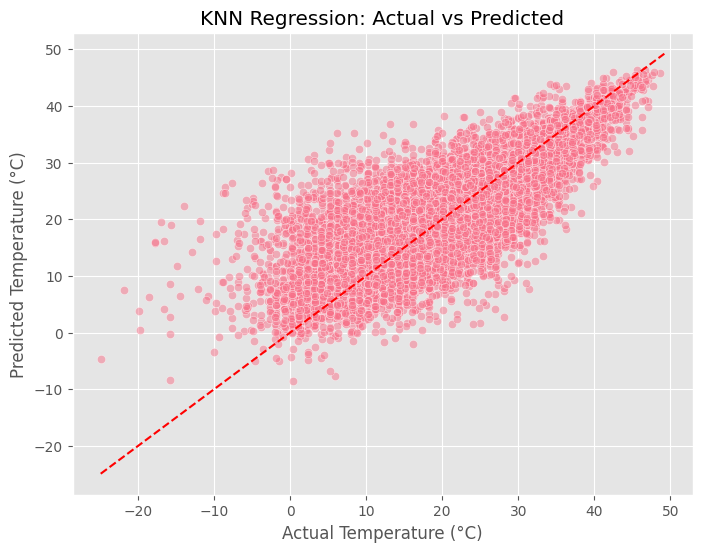

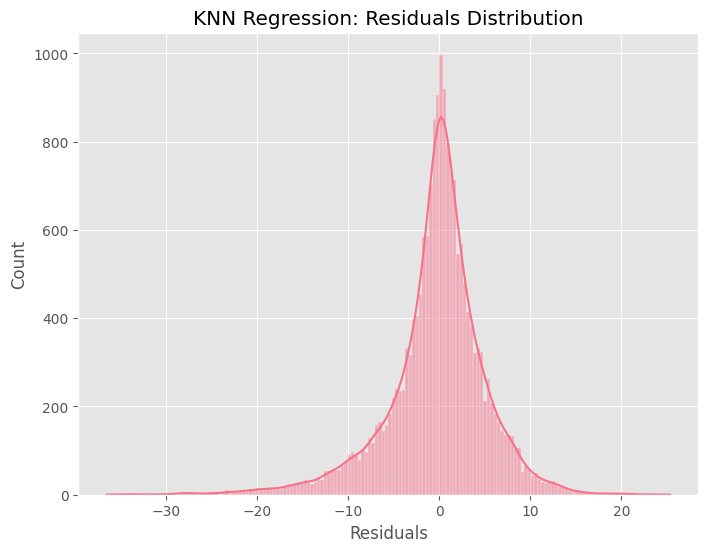

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/GlobalWeatherRepository.csv'  # Update if necessary
df = pd.read_csv(file_path)

# Select numeric features and target
features = ['humidity', 'pressure_mb', 'wind_kph', 'precip_mm', 'cloud', 'uv_index']
target = 'temperature_celsius'

# Prepare X and y
X = df[features]
y = df[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the KNN regressor
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train, y_train)

# Make predictions
y_pred = knn_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R² Score: {r2:.2f}")

# Visualization: Actual vs Predicted
plt.figure(figsize=(8,6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Predicted Temperature (°C)")
plt.title("KNN Regression: Actual vs Predicted")
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linestyle='--')
plt.show()

# Visualization: Residuals
residuals = y_test - y_pred
plt.figure(figsize=(8,6))
sns.histplot(residuals, kde=True)
plt.xlabel("Residuals")
plt.title("KNN Regression: Residuals Distribution")
plt.show()


This cell runs a K-Nearest Neighbors (KNN) Regressor model to predict `temperature_celsius` using the selected features.

*   **Mean Squared Error (MSE):** Measures the average squared difference between the actual temperature values and the predicted temperature values. A lower MSE indicates better model performance.
*   **R² Score:** Represents the proportion of the variance in the target variable (`temperature_celsius`) that is predictable from the independent variables (features). A higher value (closer to 1) means a better fit.
*   **Actual vs Predicted Plot:** This scatter plot visualizes how the predicted temperatures compare to the actual temperatures. Points close to the red dashed line indicate good predictions.
*   **Residuals Distribution Plot:** This histogram shows the distribution of the differences between the actual and predicted temperatures (residuals). Ideally, residuals should be normally distributed around zero.

# Naive Bayes

Accuracy: 0.57

Classification Report:
              precision    recall  f1-score   support

        High       0.65      0.81      0.72      9267
         Low       0.44      0.68      0.54      3527
      Medium       0.48      0.14      0.22      6148

    accuracy                           0.57     18942
   macro avg       0.52      0.55      0.49     18942
weighted avg       0.55      0.57      0.52     18942



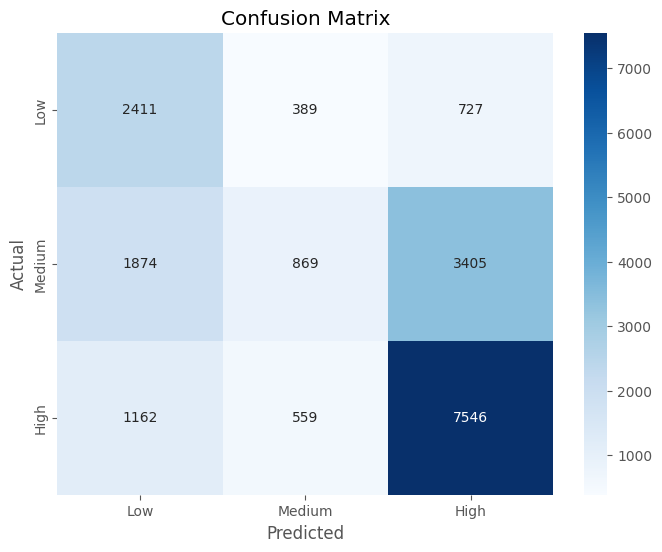

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/GlobalWeatherRepository.csv'  # Update if necessary
df = pd.read_csv(file_path)

# Create temperature categories
# Example: Low (<15°C), Medium (15-25°C), High (>25°C)
def categorize_temp(temp):
    if temp < 15:
        return 'Low'
    elif temp <= 25:
        return 'Medium'
    else:
        return 'High'

df['temp_category'] = df['temperature_celsius'].apply(categorize_temp)

# Select numeric features
features = ['humidity', 'pressure_mb', 'wind_kph', 'precip_mm', 'cloud', 'uv_index']
target = 'temp_category'

# Prepare X and y
X = df[features]
y = df[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the Gaussian Naive Bayes classifier
gnb_model = GaussianNB()
gnb_model.fit(X_train, y_train)

# Make predictions
y_pred = gnb_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix Visualization
cm = confusion_matrix(y_test, y_pred, labels=['Low', 'Medium', 'High'])
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Low', 'Medium', 'High'], yticklabels=['Low', 'Medium', 'High'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


This cell runs a Gaussian Naive Bayes classifier model to predict `temp_category` based on selected features.

*   **Accuracy:** The proportion of correctly classified instances.
*   **Classification Report:** Provides metrics like precision, recall, and F1-score for each class (Low, Medium, High temperature categories), giving a detailed view of the model's performance per category.
*   **Confusion Matrix:** A table that summarizes the performance of the classification model. It shows the counts of true positive, true negative, false positive, and false negative predictions for each class. This helps to understand where the model is confusing different temperature categories.

# Gradient Boosting Regressor

Mean Squared Error (MSE): 28.29
R² Score: 0.65


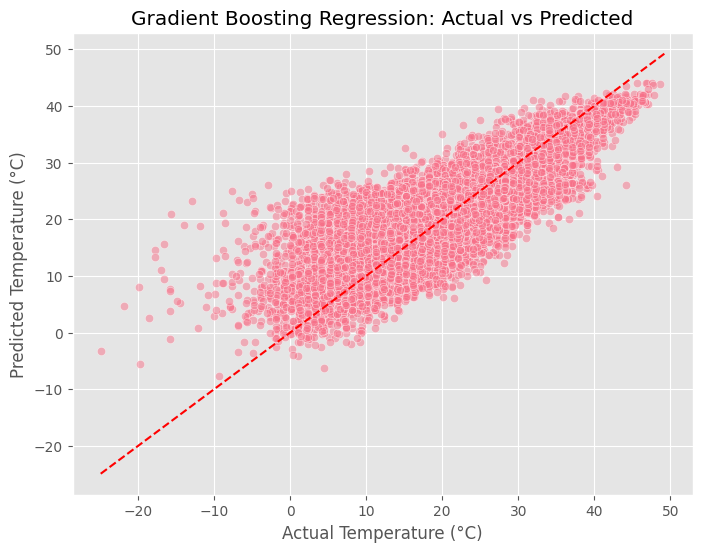

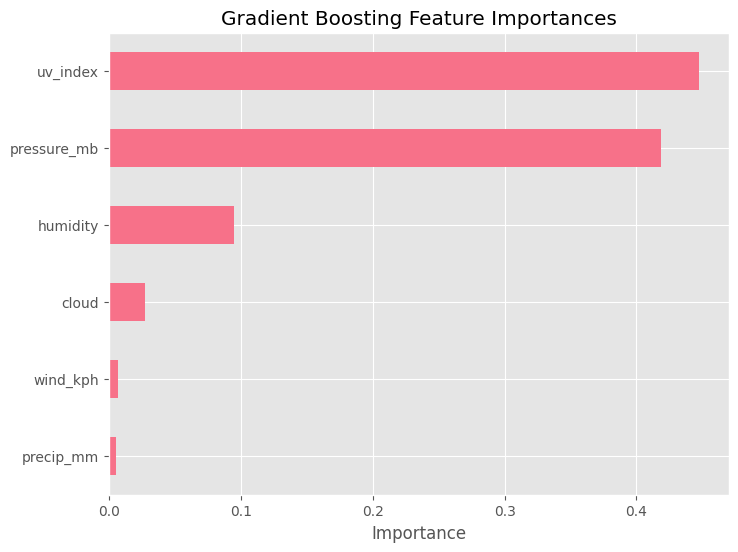

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/GlobalWeatherRepository.csv'  # Update if necessary
df = pd.read_csv(file_path)

# Select numeric features and target
features = ['humidity', 'pressure_mb', 'wind_kph', 'precip_mm', 'cloud', 'uv_index']
target = 'temperature_celsius'

# Prepare X and y
X = df[features]
y = df[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the Gradient Boosting regressor
gbr_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gbr_model.fit(X_train, y_train)

# Make predictions
y_pred = gbr_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R² Score: {r2:.2f}")

# Visualization: Actual vs Predicted
plt.figure(figsize=(8,6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Predicted Temperature (°C)")
plt.title("Gradient Boosting Regression: Actual vs Predicted")
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linestyle='--')
plt.show()

# Visualization: Feature Importances
importances = gbr_model.feature_importances_
feat_importances = pd.Series(importances, index=features)
plt.figure(figsize=(8,6))
feat_importances.sort_values().plot(kind='barh')
plt.title("Gradient Boosting Feature Importances")
plt.xlabel("Importance")
plt.show()


This cell runs a Gradient Boosting Regressor model to predict `temperature_celsius` using the selected features.

*   **Mean Squared Error (MSE):** Measures the average squared difference between actual and predicted temperatures. A lower value is better.
*   **R² Score:** This indicates how much of the variance in temperature is explained by the model. A higher value (closer to 1) means a better fit.
*   **Actual vs Predicted Plot:** This scatter plot visualizes the model's predictions to the actual temperatures. Points near the red dashed line indicate accurate predictions.
*   **Feature Importances Plot:** This bar chart shows which features were most influential in the Gradient Boosting model's temperature predictions. Features with higher bars are considered more important.

# Lightgbm

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 851
[LightGBM] [Info] Number of data points in the train set: 75764, number of used features: 6
[LightGBM] [Info] Start training from score 22.805604
Mean Squared Error (MSE): 22.98
R² Score: 0.72


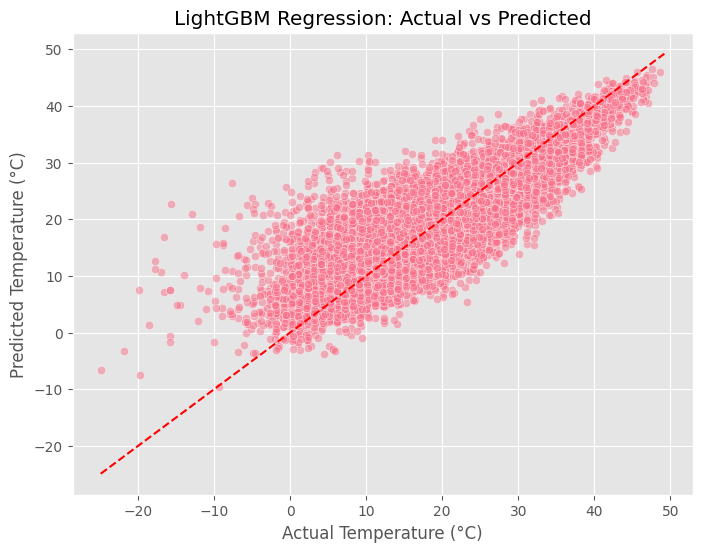

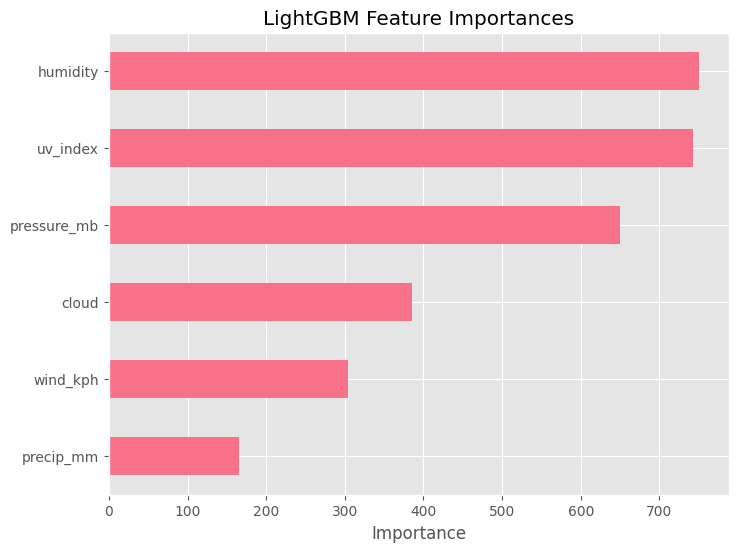

In [ ]:
# Install lightgbm if not already installed
!pip install lightgbm

# Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/GlobalWeatherRepository.csv'  # Update if necessary
df = pd.read_csv(file_path)

# Select numeric features and target
features = ['humidity', 'pressure_mb', 'wind_kph', 'precip_mm', 'cloud', 'uv_index']
target = 'temperature_celsius'

# Prepare X and y
X = df[features]
y = df[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the LightGBM regressor
lgbm_model = LGBMRegressor(n_estimators=100, learning_rate=0.1, max_depth=-1, random_state=42)
lgbm_model.fit(X_train, y_train)

# Make predictions
y_pred = lgbm_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R² Score: {r2:.2f}")

# Visualization: Actual vs Predicted
plt.figure(figsize=(8,6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Predicted Temperature (°C)")
plt.title("LightGBM Regression: Actual vs Predicted")
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linestyle='--')
plt.show()

# Visualization: Feature Importances
importances = lgbm_model.feature_importances_
feat_importances = pd.Series(importances, index=features)
plt.figure(figsize=(8,6))
feat_importances.sort_values().plot(kind='barh')
plt.title("LightGBM Feature Importances")
plt.xlabel("Importance")
plt.show()


This cell runs a LightGBM Regressor model to predict `temperature_celsius` using the selected features.

*   **Mean Squared Error (MSE):** Measures the average squared difference between actual and predicted temperatures. A lower value is better.
*   **R² Score:** This indicates how much of the variance in temperature is explained by the model. A higher value (closer to 1) means a better fit.
*   **Actual vs Predicted Plot:** This scatter plot visualizes the model's predictions to the actual temperatures. Points near the red dashed line indicate accurate predictions.
*   **Feature Importances Plot:** This bar chart shows which features were most influential in the LightGBM model's temperature predictions. Features with higher bars are considered more important.

# XG Boost

Mean Squared Error (MSE): 28.10
R² Score: 0.65


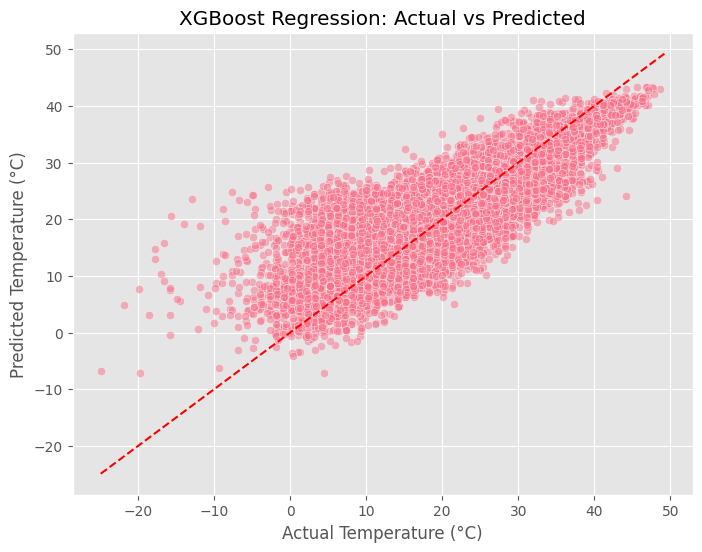

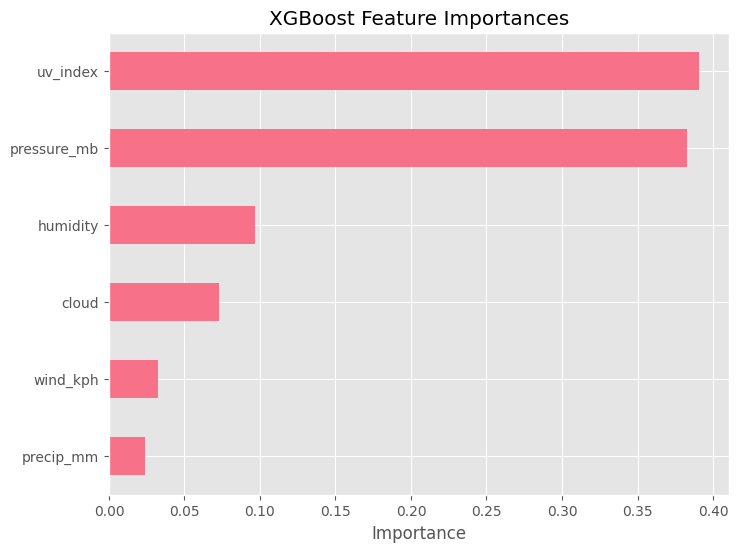

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/GlobalWeatherRepository.csv'  # Update if necessary
df = pd.read_csv(file_path)

# Select numeric features and target
features = ['humidity', 'pressure_mb', 'wind_kph', 'precip_mm', 'cloud', 'uv_index']
target = 'temperature_celsius'

# Prepare X and y
X = df[features]
y = df[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the XGBoost regressor
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42, verbosity=0)
xgb_model.fit(X_train, y_train)

# Make predictions
y_pred = xgb_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R² Score: {r2:.2f}")

# Visualization: Actual vs Predicted
plt.figure(figsize=(8,6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Predicted Temperature (°C)")
plt.title("XGBoost Regression: Actual vs Predicted")
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linestyle='--')
plt.show()

# Visualization: Feature Importances
importances = xgb_model.feature_importances_
feat_importances = pd.Series(importances, index=features)
plt.figure(figsize=(8,6))
feat_importances.sort_values().plot(kind='barh')
plt.title("XGBoost Feature Importances")
plt.xlabel("Importance")
plt.show()


This cell runs an XGBoost Regressor model to predict `temperature_celsius` using the selected features.

*   **Mean Squared Error (MSE):** Measures the average squared difference between actual and predicted temperatures. A lower value is better.
*   **R² Score:** This indicates how much of the variance in temperature is explained by the model. A higher value (closer to 1) means a better fit.
*   **Actual vs Predicted Plot:** This scatter plot visualizes the model's predictions to the actual temperatures. Points near the red dashed line indicate accurate predictions.
*   **Feature Importances Plot:** This bar chart shows which features were most influential in the XGBoost model's temperature predictions. Features with higher bars are considered more important.

# ***Phase 5:Unsupervised Learning***

# Elbow Method

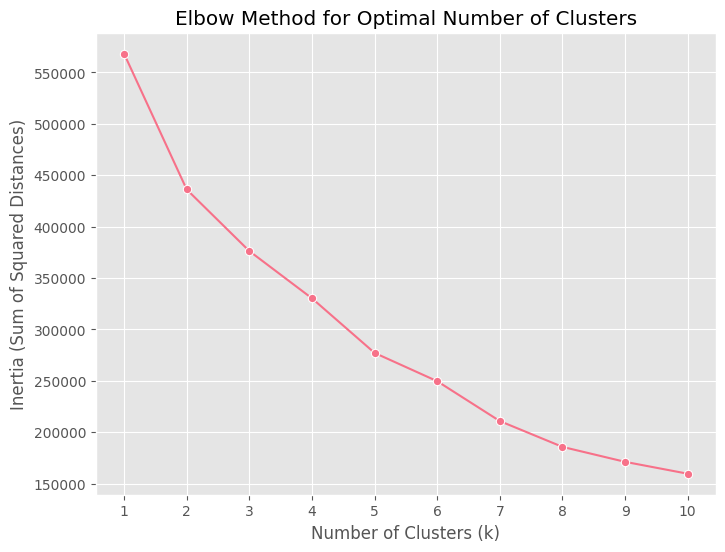

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/GlobalWeatherRepository.csv'  # Update if necessary
df = pd.read_csv(file_path)

# Select numeric features for clustering
features = ['humidity', 'pressure_mb', 'wind_kph', 'precip_mm', 'cloud', 'uv_index']
X = df[features]

# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Use the Elbow Method to find the optimal number of clusters
inertia = []
k_range = range(1, 11)  # Check 1 to 10 clusters

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot the Elbow curve
plt.figure(figsize=(8,6))
sns.lineplot(x=k_range, y=inertia, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (Sum of Squared Distances)")
plt.title("Elbow Method for Optimal Number of Clusters")
plt.xticks(k_range)
plt.show()


This plot shows the results of the Elbow Method, used to help determine the optimal number of clusters for K-Means clustering.

*   The **x-axis** represents the number of clusters (`k`) being tested.
*   The **y-axis** represents the **Inertia**, which is the sum of squared distances of samples to their closest cluster center.

The idea is to find the "elbow point" on the curve, where the rate of decrease in inertia slows down significantly. This point is often considered a good indicator of the optimal number of clusters, as adding more clusters beyond this point provides diminishing returns in terms of reducing within-cluster sum of squares.

# K-Means Clustering

Silhouette Score for 3 clusters: 0.29


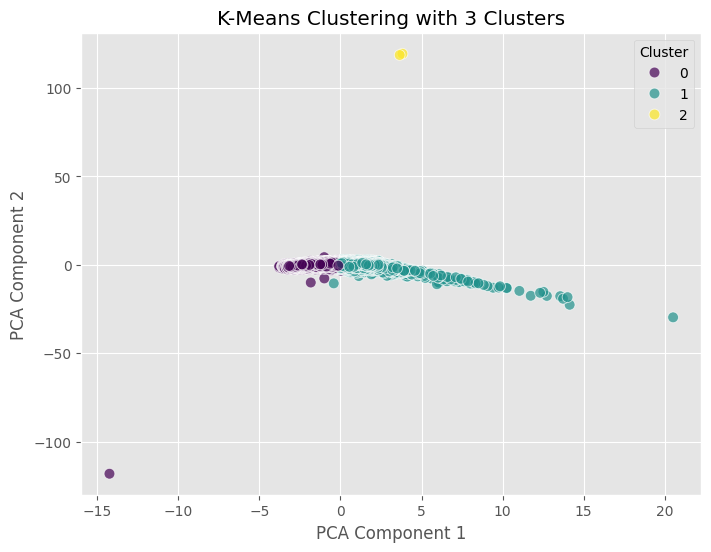

Cluster
1    53225
0    41479
2        2
Name: count, dtype: int64


In [ ]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/GlobalWeatherRepository.csv'  # Update if necessary
df = pd.read_csv(file_path)

# Select numeric features for clustering
features = ['humidity', 'pressure_mb', 'wind_kph', 'precip_mm', 'cloud', 'uv_index']
X = df[features]

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply K-Means clustering
k = 3  # Set the number of clusters (can be determined using the Elbow method)
kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
labels = kmeans.fit_predict(X_scaled)

# Add cluster labels to the original dataframe
df['Cluster'] = labels

# Evaluate clustering using Silhouette Score
score = silhouette_score(X_scaled, labels)
print(f"Silhouette Score for {k} clusters: {score:.2f}")

# Visualize the clusters using PCA for 2D plotting
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=labels, palette='viridis', s=60, alpha=0.7)
plt.title(f'K-Means Clustering with {k} Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.show()

# Display the count of samples in each cluster
print(df['Cluster'].value_counts())


This cell performs K-Means clustering on the scaled weather data.

*   The **Silhouette Score** is a metric used to evaluate the quality of the clustering. A higher silhouette score indicates that the objects are well matched to their own cluster and poorly matched to neighboring clusters.
*   The **scatterplot** visualizes the clusters in a 2D space after applying Principal Component Analysis (PCA) to reduce the dimensionality of the data. Each point represents a data sample, and its color indicates the cluster it belongs to.
*   The **count of samples in each cluster** shows how many data points were assigned to each of the identified clusters. This helps understand the size and distribution of the clusters.

# DBSCAN Clustering

Silhouette Score cannot be calculated (check parameters or if multiple clusters exist excluding noise).


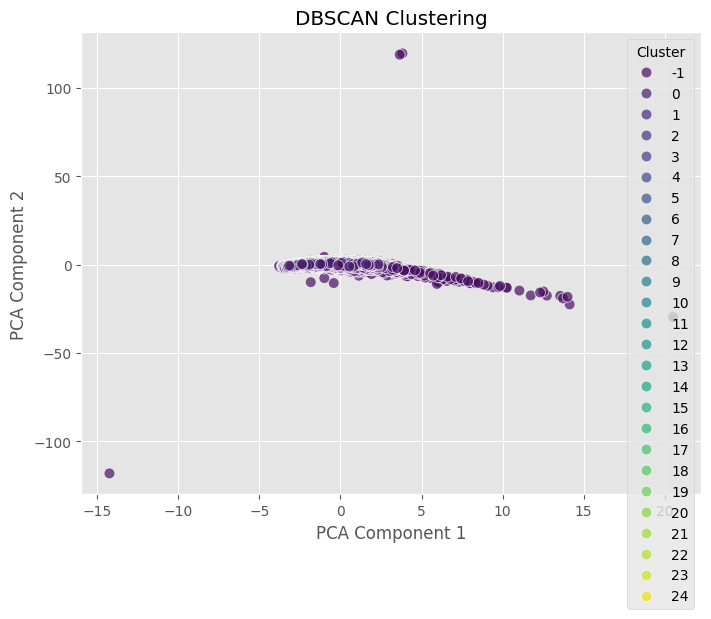

Cluster
 0     91770
-1      2781
 2        12
 8        12
 9        11
 5         9
 11        8
 3         7
 4         7
 1         7
 13        7
 22        7
 20        7
 14        6
 18        6
 19        6
 24        6
 6         5
 16        5
 12        5
 15        5
 17        4
 21        4
 23        4
 7         3
 10        2
Name: count, dtype: int64


In [ ]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/GlobalWeatherRepository.csv'  # Update if necessary
df = pd.read_csv(file_path)

# Select numeric features for clustering
features = ['humidity', 'pressure_mb', 'wind_kph', 'precip_mm', 'cloud', 'uv_index']
X = df[features]

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)  # eps and min_samples can be tuned
labels = dbscan.fit_predict(X_scaled)

# Add cluster labels to the dataframe
df['Cluster'] = labels

# Evaluate clustering using Silhouette Score (only if more than one cluster found)
unique_labels = set(labels)
if len(unique_labels) > 1 and -1 not in unique_labels:
    score = silhouette_score(X_scaled, labels)
    print(f"Silhouette Score: {score:.2f}")
else:
    print("Silhouette Score cannot be calculated (check parameters or if multiple clusters exist excluding noise).")

# Visualize the clusters using PCA for 2D plotting
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))
palette = sns.color_palette('viridis', n_colors=len(unique_labels))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=labels, palette=palette, s=60, alpha=0.7)
plt.title('DBSCAN Clustering')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.show()

# Display the count of samples in each cluster (including noise labeled as -1)
print(df['Cluster'].value_counts())


This cell performs DBSCAN clustering on the scaled weather data.

*   The **Silhouette Score** is a metric used to evaluate the quality of the clustering. A higher silhouette score indicates that the objects are well matched to their own cluster and poorly matched to neighboring clusters. However, the Silhouette Score cannot be calculated if only one cluster is found or if all points are noise.
*   The **scatterplot** visualizes the clusters in a 2D space after applying Principal Component Analysis (PCA) to reduce the dimensionality of the data. Each point represents a data sample, and its color indicates the cluster it belongs to. Points labeled as -1 are considered noise by the DBSCAN algorithm.
*   The **count of samples in each cluster** shows how many data points were assigned to each of the identified clusters, including the noise points (labeled as -1). This helps understand the size and distribution of the clusters and the amount of noise detected.

# PCA

First 5 rows of PCA results:
        PC1       PC2
0  1.336887 -0.408038
1 -0.703431 -1.600430
2  0.251618 -0.073318
3 -3.495216 -1.377813
4  0.495817  5.320838

Explained variance ratio of components:
[0.1707471  0.14912191]


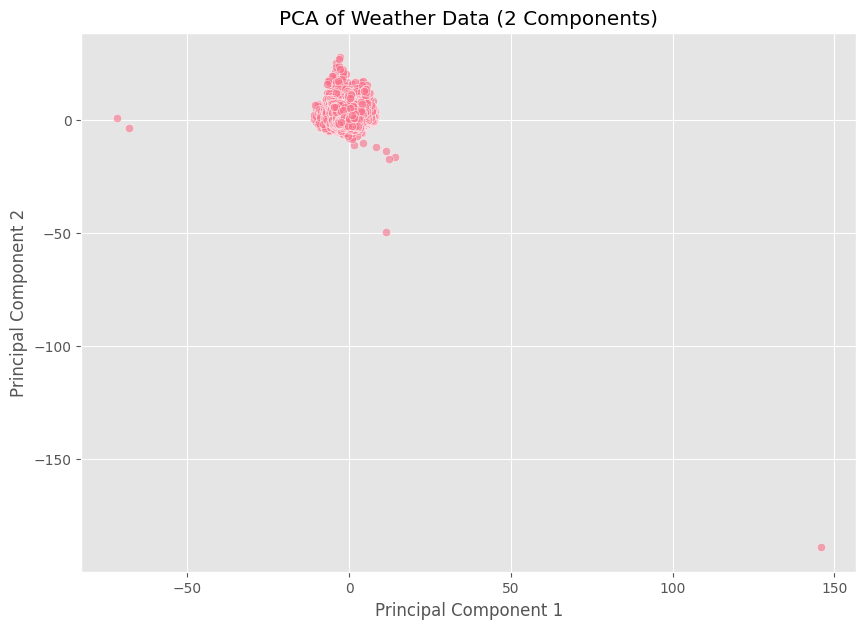

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
# Replace 'your_file_name.csv' with the actual name of your CSV file
df = pd.read_csv("/content/GlobalWeatherRepository.csv")

# Select only numeric columns for analysis
df_numeric = df.select_dtypes(include='number')

# Drop columns with all NaN values
df_numeric = df_numeric.dropna(axis=1, how='all')

# Handle missing values by filling with the mean of each column
# This is a simple approach; more advanced imputation methods may be better
df_numeric = df_numeric.fillna(df_numeric.mean())

# Scale the data using StandardScaler
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_numeric)

# Perform PCA with 2 components
pca = PCA(n_components=2)
principal_components = pca.fit_transform(df_scaled)
df_pca = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Print the first 5 rows of the PCA results
print("First 5 rows of PCA results:")
print(df_pca.head())

# Print the explained variance ratio of the components
print("\nExplained variance ratio of components:")
print(pca.explained_variance_ratio_)

# Visualize the PCA results
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PC1', y='PC2', data=df_pca, alpha=0.6)
plt.title('PCA of Weather Data (2 Components)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

This cell performs Principal Component Analysis (PCA) on the standardized numerical weather data and visualizes the result in 2D.

*   **Principal Component 1 (PC1)** and **Principal Component 2 (PC2)** are the two new dimensions created by PCA, capturing the most variance in the original data.
*   The **scatterplot** shows each data point plotted in this new 2D space defined by PC1 and PC2.
*   The **explained variance ratio** indicates the proportion of the total variance in the original data that is captured by each principal component.

This visualization helps in understanding the main sources of variation in the weather data and can reveal potential groupings or structures that might not be obvious in the original high-dimensional space.

# GMM Clustering

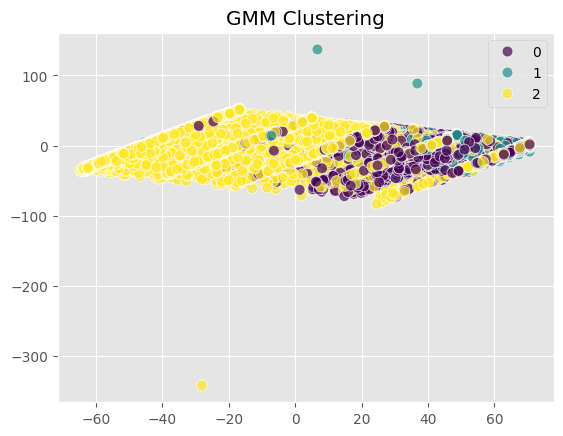

In [ ]:
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

labels = GaussianMixture(n_components=3, random_state=42).fit_predict(X)
X_pca = PCA(n_components=2).fit_transform(X)

sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=labels, palette='viridis', s=60, alpha=0.7)
plt.title('GMM Clustering')
plt.show()


This cell performs Gaussian Mixture Model (GMM) clustering on the data.

*   The **scatterplot** visualizes the clusters in a 2D space after applying Principal Component Analysis (PCA) to reduce the dimensionality of the data. Each point represents a data sample, and its color indicates the cluster it has been assigned to by the GMM algorithm.

This plot helps in visualizing the clusters identified by the GMM in a lower-dimensional space, allowing for a better understanding of the data's structure.

# Transactional Data

In [ ]:
# Import libraries
import pandas as pd

# Example transactional data
dataset = [
    ['milk', 'bread', 'nuts', 'apple'],
    ['milk', 'bread', 'nuts'],
    ['milk', 'bread'],
    ['milk', 'bread', 'apple'],
    ['bread', 'nuts'],
    ['milk', 'nuts'],
    ['bread', 'apple'],
    ['milk', 'bread', 'nuts', 'apple'],
]

# Convert to DataFrame
df = pd.DataFrame(dataset, columns=['Item1', 'Item2', 'Item3', 'Item4'])
print("Sample Transactional Data:")
print(df.head())


Sample Transactional Data:
   Item1  Item2  Item3  Item4
0   milk  bread   nuts  apple
1   milk  bread   nuts   None
2   milk  bread   None   None
3   milk  bread  apple   None
4  bread   nuts   None   None


This cell creates and displays a sample transactional dataset using a Python list of lists and then converting it into a pandas DataFrame.

*   The `dataset` variable holds the list of transactions, where each inner list represents the items bought in a single transaction.
*   The code then converts this list into a pandas DataFrame with columns named 'Item1', 'Item2', etc.

The output shows the first 5 rows of this DataFrame, illustrating the structure of the transactional data where each row is a transaction and the columns contain the items. This format is suitable for applying association rule mining algorithms like Apriori, Eclat, or FP-Growth.

In [ ]:
!pip install mlxtend


# Apriori Algorithm

In [ ]:
from mlxtend.frequent_patterns import apriori, association_rules
from mlxtend.preprocessing import TransactionEncoder
import warnings

# Ignore DeprecationWarning
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Prepare data using TransactionEncoder
te = TransactionEncoder()
te_ary = te.fit(dataset).transform(dataset)
df_trans = pd.DataFrame(te_ary, columns=te.columns_)

# Generate frequent itemsets
frequent_itemsets = apriori(df_trans, min_support=0.3, use_colnames=True)

# Generate association rules
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.7)

print("Frequent Itemsets using Apriori:")
print(frequent_itemsets)

print("\nAssociation Rules:")
print(rules[['antecedents', 'consequents', 'support', 'confidence', 'lift']])


Frequent Itemsets using Apriori:
    support              itemsets
0     0.500               (apple)
1     0.875               (bread)
2     0.750                (milk)
3     0.625                (nuts)
4     0.500        (apple, bread)
5     0.375         (milk, apple)
6     0.625         (milk, bread)
7     0.500         (nuts, bread)
8     0.500          (milk, nuts)
9     0.375  (milk, apple, bread)
10    0.375   (milk, nuts, bread)

Association Rules:
       antecedents    consequents  support  confidence      lift
0          (apple)        (bread)    0.500    1.000000  1.142857
1          (apple)         (milk)    0.375    0.750000  1.000000
2           (milk)        (bread)    0.625    0.833333  0.952381
3          (bread)         (milk)    0.625    0.714286  0.952381
4           (nuts)        (bread)    0.500    0.800000  0.914286
5           (nuts)         (milk)    0.500    0.800000  1.066667
6    (milk, apple)        (bread)    0.375    1.000000  1.142857
7   (apple, bread) 

This cell applies the Apriori algorithm to the transactional data to find frequent itemsets and generate association rules.

*   **Frequent Itemsets:** These are combinations of items that appear together in transactions above a specified minimum support threshold. The output shows the itemsets and their support values.
*   **Association Rules:** These rules describe relationships between itemsets. A rule like {A} -> {B} means that if item(s) A are purchased, then item(s) B are likely to be purchased as well. The output includes metrics like:
    *   **Support:** The proportion of transactions that contain both the antecedent and consequent.
    *   **Confidence:** The probability of buying the consequent given that the antecedent is bought (Support({A,B}) / Support({A})).
    *   **Lift:** Measures how much more likely the consequent is to be bought when the antecedent is bought, compared to its baseline probability (Confidence({A} -> {B}) / Support({B})). A lift greater than 1 indicates a positive association.

# Eclat Algorithm

In [ ]:
from itertools import combinations

# Get all unique items
items = set()
for transaction in dataset:
    for item in transaction:
        items.add(item)
items = list(items)

# Create dictionary mapping item to transaction indices
item_tid = {}
for item in items:
    item_tid[item] = set(i for i, transaction in enumerate(dataset) if item in transaction)

# Function to find frequent itemsets with support >= min_support
def eclat(itemset, tids, min_support, results):
    support = len(tids) / len(dataset)
    if support >= min_support:
        results.append((itemset, support))
        for item in items:
            if item not in itemset:
                new_itemset = tuple(sorted(itemset + (item,)))
                if new_itemset not in [res[0] for res in results]:
                    new_tids = tids & item_tid[item]
                    if new_tids:
                        eclat(new_itemset, new_tids, min_support, results)

# Run Eclat
min_support = 0.3
results = []
for item in items:
    eclat((item,), item_tid[item], min_support, results)

print("Frequent Itemsets using Eclat:")
for itemset, support in results:
    print(f"Itemset: {itemset}, Support: {support:.2f}")

Frequent Itemsets using Eclat:
Itemset: ('milk',), Support: 0.75
Itemset: ('apple', 'milk'), Support: 0.38
Itemset: ('apple', 'bread', 'milk'), Support: 0.38
Itemset: ('milk', 'nuts'), Support: 0.50
Itemset: ('bread', 'milk', 'nuts'), Support: 0.38
Itemset: ('bread', 'milk'), Support: 0.62
Itemset: ('apple',), Support: 0.50
Itemset: ('apple', 'bread'), Support: 0.50
Itemset: ('nuts',), Support: 0.62
Itemset: ('bread', 'nuts'), Support: 0.50
Itemset: ('bread',), Support: 0.88


This cell applies the Eclat algorithm to the transactional data to find frequent itemsets.

*   **Frequent Itemsets:** These are combinations of items that appear together in transactions above a specified minimum support threshold.
*   **Support:** The proportion of transactions that contain the specific itemset.

The output lists the frequent itemsets found by the algorithm and their corresponding support values. Eclat is an alternative to the Apriori algorithm for this task.

# FP-Growth Algorithm

In [ ]:
from mlxtend.frequent_patterns import fpgrowth

# Generate frequent itemsets using FP-Growth
frequent_itemsets_fp = fpgrowth(df_trans, min_support=0.3, use_colnames=True)

# Generate association rules
rules_fp = association_rules(frequent_itemsets_fp, metric="confidence", min_threshold=0.7)

print("Frequent Itemsets using FP-Growth:")
print(frequent_itemsets_fp)

print("\nAssociation Rules:")
print(rules_fp[['antecedents', 'consequents', 'support', 'confidence', 'lift']])


Frequent Itemsets using FP-Growth:
    support              itemsets
0     0.875               (bread)
1     0.750                (milk)
2     0.625                (nuts)
3     0.500               (apple)
4     0.625         (milk, bread)
5     0.500          (milk, nuts)
6     0.500         (nuts, bread)
7     0.375   (milk, nuts, bread)
8     0.500        (apple, bread)
9     0.375         (milk, apple)
10    0.375  (milk, apple, bread)

Association Rules:
       antecedents    consequents  support  confidence      lift
0           (milk)        (bread)    0.625    0.833333  0.952381
1          (bread)         (milk)    0.625    0.714286  0.952381
2           (nuts)         (milk)    0.500    0.800000  1.066667
3           (nuts)        (bread)    0.500    0.800000  0.914286
4     (milk, nuts)        (bread)    0.375    0.750000  0.857143
5    (nuts, bread)         (milk)    0.375    0.750000  1.000000
6          (apple)        (bread)    0.500    1.000000  1.142857
7          (apple

This cell applies the FP-Growth algorithm to the transactional data to find frequent itemsets and generate association rules.

*   **Frequent Itemsets:** These are combinations of items that appear together in transactions above a specified minimum support threshold. The output shows the itemsets and their support values.
*   **Association Rules:** These rules describe relationships between itemsets. A rule like {A} -> {B} means that if item(s) A are purchased, then item(s) B are likely to be purchased as well. The output includes metrics like:
    *   **Support:** The proportion of transactions that contain both the antecedent and consequent.
    *   **Confidence:** The probability of buying the consequent given that the antecedent is bought (Support({A,B}) / Support({A})).
    *   **Lift:** Measures how much more likely the consequent is to be bought when the antecedent is bought, compared to its baseline probability (Confidence({A} -> {B}) / Support({B})). A lift greater than 1 indicates a positive association.

# ***Phase 6: Visualization***

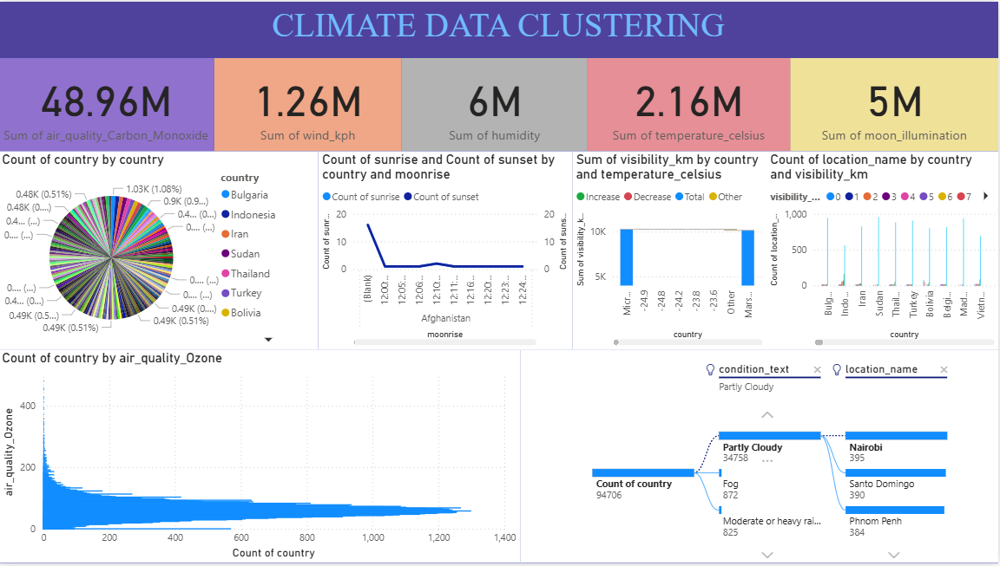

A power BI visualization for the GlobalWeatherRepository dataset for climate data clustering